In [1]:
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision import models
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
import glob
import os
from PIL import Image
import time
import cv2
from tqdm import tqdm
import albumentations as alb
from albumentations import augmentations

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [2]:
image_parent_dir = '/workspace/src/src/Img6/ImgIN/'
image_id_array = np.array([image_path.split('/')[-1].split('.')[0].split('_')[-1] for image_path in glob.glob(image_parent_dir + '*.jpeg')])

class_dict = {
    'trees': {'parent_dir': '/workspace/src/src/Img6/MaskTrees/', 'value': 1, 'color': [0, 255, 0]},
    'foliage': {'parent_dir': '/workspace/src/src/Img6/MaskFoliage/', 'value': 2, 'color': [204, 119, 34]},
    'water': {'parent_dir': '/workspace/src/src/Img6/MaskWater/', 'value': 3, 'color': [128, 166, 255]},
    'cable': {'parent_dir': '/workspace/src/src/Img6/MaskCable/', 'value': 4, 'color': [255, 255, 0]},
    'tower': {'parent_dir': '/workspace/src/src/Img6/MaskOpora/', 'value': 5, 'color': [255, 0, 0]},
    'osnastka': {'parent_dir': '/workspace/src/src/Img6/MaskOsnastka/', 'value': 6, 'color': [192, 192, 192]},
    'podporka': {'parent_dir': '/workspace/src/src/Img6/MaskPodporka/', 'value': 7, 'color': [128, 0, 0]},
    'mechanisms': {'parent_dir': '/workspace/src/src/Img6/MaskMechanisms/', 'value': 8, 'color': [128, 128, 128]}
            }


In [3]:
class FaceDataset(Dataset):
    
    def __init__(self, image_parent_dir, class_dict, image_id_array, encoder_name, mode='valid', image_height=1080, image_width=1920):
        self.image_parent_dir = image_parent_dir
        self.class_dict = class_dict
        self.image_id_array = image_id_array
        self.mode = mode
        self.encoder_name = encoder_name
        self.image_height = image_height
        self.image_width = image_width
        self.preprocess_params = smp.encoders.get_preprocessing_params(self.encoder_name, pretrained='imagenet')
        self.transform_pair = alb.Compose([
                                    augmentations.HorizontalFlip(p=0.5),
                                    augmentations.RandomBrightnessContrast(p=0.2),
                                    augmentations.SafeRotate(limit=10, p=0.7),
                                    augmentations.MaskDropout(max_objects=1, image_fill_value=0, mask_fill_value=0, always_apply=False, p=0.5),
                                    augmentations.CropAndPad(percent=(-0.1, +0.1), keep_size=True, p=0.7, interpolation=cv2.INTER_NEAREST),
                                    augmentations.GaussNoise(var_limit=10.0, p=0.5)
                                    ])        
        self.transform_image = transforms.Compose([
                                transforms.ToTensor(),
                                 transforms.Normalize(self.preprocess_params['mean'], self.preprocess_params['std'])
                                    ])          
    
            
    def get_common_mask(self, idx):
        common_mask = np.zeros((1080, 1080), dtype=np.int64)
        for class_name in class_dict.keys():
            path_to_mask=class_dict[class_name]['parent_dir'] + 'Mask_' + self.image_id_array[idx] + '.jpeg'
            if os.path.exists(path_to_mask):
                mask = cv2.imread(path_to_mask)
                mask = mask[:, self.image_width//2 - self.image_height//2 : self.image_width//2 + self.image_height//2]
                common_mask[(mask[:,:,0]!=0)] = class_dict[class_name]['value']
        return common_mask
    
    def get_rgb_mask(self, idx):
        result_image = np.zeros((self.image_height, self.image_height, 3), dtype=np.uint8)
        common_mask = self.get_common_mask(idx)
        for height in range(self.image_height):
            for width in range(self.image_height):
                for class_name in class_dict.keys():
                    if common_mask[height, width] == self.class_dict[class_name]['value']:
                        result_image[height, width] = np.array(self.class_dict[class_name]['color'], dtype=np.uint8)
        return result_image
            
    def get_input_image(self, idx):
        image = cv2.imread(self.image_parent_dir + 'Img_' + self.image_id_array[idx] + '.jpeg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = image[:, self.image_width//2 - self.image_height//2 : self.image_width//2 + self.image_height//2]
        return image
        
    def __len__(self):
        return self.image_id_array.shape[0]    
        
    def __getitem__(self, idx):

        image = self.get_input_image(idx)
        mask = self.get_common_mask(idx)
        
        if self.mode=='train':
            transformed = self.transform_pair(image=image, mask=mask)
            image = transformed['image']
            mask = transformed['mask']
            
        image_tensor = self.transform_image(image)
        mask_tensor = torch.tensor(mask, dtype=torch.int64)
        
        return image_tensor, mask_tensor


In [4]:
train_image_id_array, valid_test_image_id_array = train_test_split(image_id_array, test_size=0.3, random_state=42)
valid_image_id_array, test_image_id_array = train_test_split(valid_test_image_id_array, test_size=0.5, random_state=42)

train_dataset = FaceDataset(image_parent_dir=image_parent_dir, 
                            class_dict=class_dict, 
                            image_id_array=train_image_id_array, 
                            encoder_name='resnet18', 
                            mode='train')
train_dataloader = DataLoader(dataset=train_dataset, batch_size=4, num_workers=2, shuffle=True, drop_last=True)

valid_dataset = FaceDataset(image_parent_dir=image_parent_dir, 
                            class_dict=class_dict, 
                            image_id_array=valid_image_id_array, 
                            encoder_name='resnet18', 
                            mode='valid')
valid_dataloader = DataLoader(dataset=valid_dataset, batch_size=4, num_workers=2, shuffle=False)

test_dataset = FaceDataset(image_parent_dir=image_parent_dir, 
                            class_dict=class_dict, 
                            image_id_array=test_image_id_array, 
                            encoder_name='resnet18', 
                            mode='valid')
test_dataloader = DataLoader(dataset=test_dataset, batch_size=4, num_workers=2, shuffle=False)

In [5]:
test_dataset[0][0]

tensor([[[ 0.5707,  0.8447,  0.6221,  ...,  0.1768,  0.3994,  0.5878],
         [ 0.6049,  0.8447,  0.6906,  ...,  0.2111,  0.3481,  0.7762],
         [ 0.5707,  0.8276,  0.7591,  ...,  0.2282,  0.4679,  0.7933],
         ...,
         [ 0.1254,  0.1597,  0.2111,  ...,  0.6221,  0.4851,  0.6049],
         [ 0.6563,  0.3309,  0.2282,  ...,  0.8618,  0.8789,  0.6734],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[ 0.9930,  1.2731,  1.0630,  ...,  0.6604,  0.8704,  1.0630],
         [ 1.0280,  1.2731,  1.1331,  ...,  0.6954,  0.8179,  1.2556],
         [ 0.9930,  1.2556,  1.2031,  ...,  0.7129,  0.9230,  1.2206],
         ...,
         [ 0.5203,  0.6078,  0.6779,  ...,  0.9930,  0.8179,  0.9055],
         [ 0.9930,  0.6954,  0.6078,  ...,  1.1506,  1.1681,  0.9230],
         [-1.9657, -1.9482, -1.9657,  ..., -1.9832, -2.0007, -1.9832]],

        [[ 1.0365,  1.2980,  1.1062,  ...,  0.8448,  1.0539,  1.2108],
         [ 1.0714,  1.3154,  1.1759,  ...,  0

In [7]:
class ModelWrapper():
    
    def __init__(self, model, classes):
        self.classes = classes
        self.model = model
        self.optimizer = torch.optim.RAdam(self.model.parameters(), lr=1e-3)
        self.loss_function = smp.losses.DiceLoss(mode='multiclass', classes=self.classes, from_logits=False)
        self.scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer=self.optimizer, T_max=100)
        self.model.to(device)
    
    def fit(self, train_dataloader, valid_dataloader, 
            max_epoch_num=1e3, epoch_num_early_stopping=10, print_each_nth_epoch=10):
        
        # epoch_num_early_stopping = number of epochs 
        # that didn't decrease the best loss of epoch (min_epoch_loss)
        
        epoch_array = np.empty((0))
        train_loss_array = np.empty((0))
        valid_loss_array = np.empty((0))
    
        epoch = 1
        
        min_epoch_loss = np.inf
        epoch_num_without_imporovement = 0
        
        cur_epoch_time = time.time()
        
        # training by epochs
        while epoch <= max_epoch_num and epoch_num_without_imporovement<=epoch_num_early_stopping:
            
            self.model.train()
            train_epoch_loss = 0
            valid_epoch_loss = 0
#             cur_batch_time = time.time()
            # batch-wise training within an epoch
            for batch, (x, y) in tqdm(enumerate(train_dataloader)):

                x, y = x.to(device), y.to(device)
                
                # straightforward move
                output = self.model(x)
                
                loss = self.loss_function(output, y)
                train_epoch_loss = (train_epoch_loss * batch + loss.item()) / (batch + 1)
                
                # backpropagation
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                
#                 print_each_nth_batch = 10
#                 if batch%print_each_nth_batch==0:
#                     print('batch #', batch, 
#                           '   |   train_batch_loss:', loss.item(), 
#                          '   |   ', print_each_nth_batch, ' batches of ', train_dataloader.batch_size, 
#                           ' samples took', np.round(time.time() - cur_batch_time), ' s')
#                     cur_batch_time = time.time()
                
            valid_epoch_loss = self.validation_loss(valid_dataloader)
            
            epoch_array = np.append(epoch_array, epoch)
            train_loss_array = np.append(train_loss_array, train_epoch_loss)
            valid_loss_array = np.append(valid_loss_array, valid_epoch_loss)
            
            # prints losses every x epochs
            if epoch%print_each_nth_epoch==0:
                print('epoch ', epoch, 
                      '   |   train_epoch_loss:', train_epoch_loss, 
                      '   |   valid_epoch_loss:', valid_epoch_loss, 
                     '   |   ', print_each_nth_epoch, ' epochs took', np.round(time.time() - cur_epoch_time), ' s')
                cur_epoch_time = time.time()

            # increases num of epochs without decrease of validation loss        
            if valid_epoch_loss > min_epoch_loss: 
                epoch_num_without_imporovement += 1
            else: 
                min_epoch_loss = valid_epoch_loss
                epoch_num_without_imporovement = 0
                
            epoch += 1
            
            self.scheduler.step()
            
        return epoch_array, train_loss_array, valid_loss_array
    
    def validation_loss(self, dataloader):
        self.model.eval()
        with torch.no_grad():
            valid_loss = 0
            for batch, (x, y) in enumerate(dataloader):
                
                x, y = x.to(device), y.to(device)
                
                output = self.model(x)
                
                valid_loss = (valid_loss * batch + self.loss_function(output, y).item()) / (batch + 1)
                
            return valid_loss
    
    def predict(self, dataloader):
        self.model.eval()
        with torch.no_grad():
            prediction = torch.empty((0, self.classes, dataloader.dataset.image_height, dataloader.dataset.image_width), 
                                     dtype=torch.float32).to(device)
            for batch, (x, y) in enumerate(dataloader):
                
                x, y = x.to(device), y.to(device)
                
                output = self.model(x)
                prediction = torch.cat((prediction, output), dim=0)
        return prediction

In [8]:
classes = 9
model = smp.DeepLabV3(encoder_name='resnet18',
                          classes=classes,
                          encoder_depth=5, 
                          encoder_weights='imagenet', 
                          decoder_channels=256, 
                          in_channels=3, 
                          upsampling=8,
                         activation='softmax')

In [9]:
# model = torch.load('./saved/deeplabv3_resnet18.pt')

model_wrapper = ModelWrapper(model, classes=classes)

epoch_array, train_loss_array, valid_loss_array = model_wrapper.fit(
                train_dataloader=train_dataloader, 
                  valid_dataloader=valid_dataloader,
                 max_epoch_num=20, 
                 epoch_num_early_stopping=10,
                print_each_nth_epoch=1)
torch.save(model_wrapper.model, './saved/deeplabv3_resnet18.pt')

0it [00:00, ?it/s]/opt/conda/lib/python3.7/site-packages/segmentation_models_pytorch/base/modules.py:104: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self.activation(x)
234it [07:09,  1.84s/it]


epoch  1    |   train_epoch_loss: 0.3600651940219422    |   valid_epoch_loss: 0.28670598274352505    |    1  epochs took 460.0  s


234it [07:11,  1.84s/it]


epoch  2    |   train_epoch_loss: 0.23511389216296696    |   valid_epoch_loss: 0.4268031412479924    |    1  epochs took 462.0  s


234it [07:12,  1.85s/it]


epoch  3    |   train_epoch_loss: 0.22888581305105463    |   valid_epoch_loss: 0.2441246351775001    |    1  epochs took 464.0  s


234it [07:10,  1.84s/it]


epoch  4    |   train_epoch_loss: 0.20880014044988876    |   valid_epoch_loss: 0.19214964278188407    |    1  epochs took 461.0  s


234it [07:09,  1.83s/it]


epoch  5    |   train_epoch_loss: 0.19849905186993444    |   valid_epoch_loss: 0.17731478635002584    |    1  epochs took 460.0  s


234it [07:12,  1.85s/it]


epoch  6    |   train_epoch_loss: 0.18769027499689    |   valid_epoch_loss: 0.16788791675193637    |    1  epochs took 463.0  s


234it [07:13,  1.85s/it]


epoch  7    |   train_epoch_loss: 0.19272856532126414    |   valid_epoch_loss: 0.19318503389755884    |    1  epochs took 465.0  s


234it [07:11,  1.84s/it]


epoch  8    |   train_epoch_loss: 0.18445906718062535    |   valid_epoch_loss: 0.18424471701477085    |    1  epochs took 462.0  s


234it [07:11,  1.84s/it]


epoch  9    |   train_epoch_loss: 0.17791872973052356    |   valid_epoch_loss: 0.1608378342261502    |    1  epochs took 462.0  s


234it [07:12,  1.85s/it]


epoch  10    |   train_epoch_loss: 0.1862835141742585    |   valid_epoch_loss: 0.16289360602112374    |    1  epochs took 463.0  s


234it [07:10,  1.84s/it]


epoch  11    |   train_epoch_loss: 0.1703076475960576    |   valid_epoch_loss: 0.16422624374721564    |    1  epochs took 462.0  s


234it [07:08,  1.83s/it]


epoch  12    |   train_epoch_loss: 0.1734387712855624    |   valid_epoch_loss: 0.15904967749820037    |    1  epochs took 459.0  s


234it [07:14,  1.86s/it]


epoch  13    |   train_epoch_loss: 0.18223723476259113    |   valid_epoch_loss: 0.17903227607409158    |    1  epochs took 466.0  s


234it [07:12,  1.85s/it]


epoch  14    |   train_epoch_loss: 0.17606075779877167    |   valid_epoch_loss: 0.16068612126743093    |    1  epochs took 465.0  s


234it [07:10,  1.84s/it]


epoch  15    |   train_epoch_loss: 0.17068897499742666    |   valid_epoch_loss: 0.2048911414310044    |    1  epochs took 461.0  s


234it [07:08,  1.83s/it]


epoch  16    |   train_epoch_loss: 0.16675746450439471    |   valid_epoch_loss: 0.15440532681988725    |    1  epochs took 459.0  s


234it [07:11,  1.84s/it]


epoch  17    |   train_epoch_loss: 0.16206086888654614    |   valid_epoch_loss: 0.14954791860837569    |    1  epochs took 462.0  s


234it [07:11,  1.84s/it]


epoch  18    |   train_epoch_loss: 0.16549959065567735    |   valid_epoch_loss: 0.16944588750016462    |    1  epochs took 462.0  s


234it [07:08,  1.83s/it]


epoch  19    |   train_epoch_loss: 0.17226091718189737    |   valid_epoch_loss: 0.15937384334849378    |    1  epochs took 459.0  s


234it [07:08,  1.83s/it]


epoch  20    |   train_epoch_loss: 0.16674814207686314    |   valid_epoch_loss: 0.1680139938698095    |    1  epochs took 459.0  s


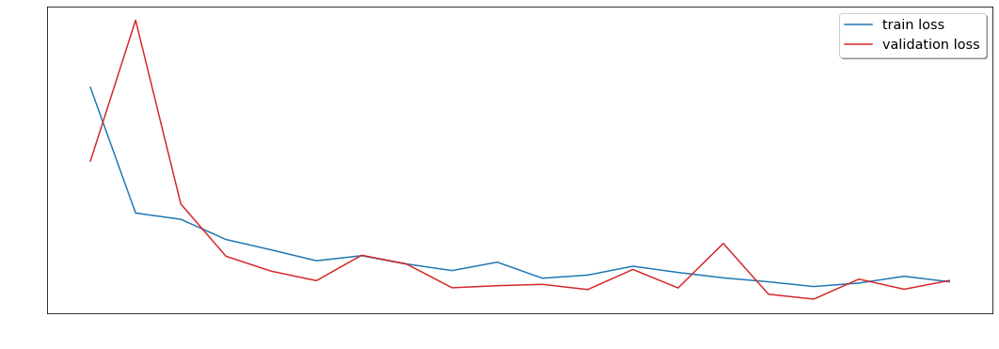

In [10]:
def plot_loss(epoch_array, train_loss_array, valid_loss_array):

    fig = plt.figure(num=1, figsize=(18,6))
    ax = fig.add_subplot(111)

    ax.plot(epoch_array, train_loss_array, color='tab:blue', label='train loss')
    ax.plot(epoch_array, valid_loss_array, color='tab:red', label='validation loss')
    ax.set_xlabel('epoch')
    ax.set_ylabel('loss')
    ax.xaxis.label.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    legend = ax.legend(loc='upper right', shadow=True, fontsize='x-large')
    plt.show()

plot_loss(epoch_array, train_loss_array, valid_loss_array)

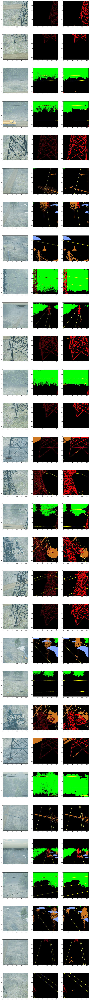

In [16]:
def get_result_mask(model, input_tensor, image_height, image_width):
    output_tensor = model(input_tensor.to(device)).cpu().detach().numpy()
    class_map = np.argmax(output_tensor, axis=1)[0]
    result_image = np.zeros((image_height, image_height, 3), dtype=np.uint8)
    for height in range(image_height):
        for width in range(image_width):
            for class_name in class_dict.keys():
                if class_map[height, width] == class_dict[class_name]['value']:
                    result_image[height, width] = np.array(class_dict[class_name]['color'], dtype=np.uint8)
    return result_image

sample_num = 30
fig = plt.figure(figsize=(20, sample_num * 8))
for idx in range(1,sample_num+1):
    
    fig.add_subplot(sample_num, 3, 3 * idx - 2)
    plt.imshow(test_dataset.get_input_image(idx))
    
    fig.add_subplot(sample_num, 3, 3 * idx - 1)
    plt.imshow(test_dataset.get_rgb_mask(idx))
    
    fig.add_subplot(sample_num, 3, 3 * idx)
    input_tensor = test_dataset[idx][0][None,...]
    plt.imshow(get_result_mask(model_wrapper.model, input_tensor, test_dataset.image_height, test_dataset.image_height))